<a href="https://colab.research.google.com/github/Suhas-S63/Deep_Learning_Lab/blob/main/2348563_DL_Lab_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Classification with Convolutional Neural Networks

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

## Loading the Image Data and creating training and testing splits

In [12]:
img_folder = '/content/drive/MyDrive/Animals'


# Image Augmentation
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

train_generator = datagen.flow_from_directory(
    img_folder,
    target_size=(160, 160),
    batch_size=16,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    img_folder,
    target_size=(160, 160),
    batch_size=16,
    class_mode='categorical',
    subset='validation'
)


Found 138 images belonging to 5 classes.
Found 32 images belonging to 5 classes.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Cheetah
/content/drive/MyDrive/Animals/Cheetah/animal-africa-wilderness-zoo.jpg
/content/drive/MyDrive/Animals/Cheetah/pexels-photo-3714902.jpeg
/content/drive/MyDrive/Animals/Cheetah/pexels-photo-2793479.jpeg
/content/drive/MyDrive/Animals/Cheetah/namibia-84246__340.jpg
/content/drive/MyDrive/Animals/Cheetah/pexels-photo-1109898.jpeg
Jaguar
/content/drive/MyDrive/Animals/Jaguar/photo-1528238344097-a8994f7c74e4.jpg
/content/drive/MyDrive/Animals/Jaguar/photo-1477949775154-d739b82400b3 (1).jpg
/content/drive/MyDrive/Animals/Jaguar/pexels-photo-773004.jpeg
/content/drive/MyDrive/Animals/Jaguar/pexels-photo-4468189.jpeg
/content/drive/MyDrive/Animals/Jaguar/photo-1469367498026-54a83d222f12.jpg
Leopard
/content/drive/MyDrive/Animals/Leopard/photo-1541893321-dcc3e4dcb6dc.jpg
/content/drive/MyDrive/Animals/Leopard/photo-1486199149722-825253b06114.jpg
/content/drive/MyDrive/Animals/Leopard/photo-1477120696339-2258698d9d72.jpg
/content/drive/MyDrive/Animals/Leopard/pexels-photo-7003062.jpeg
/c

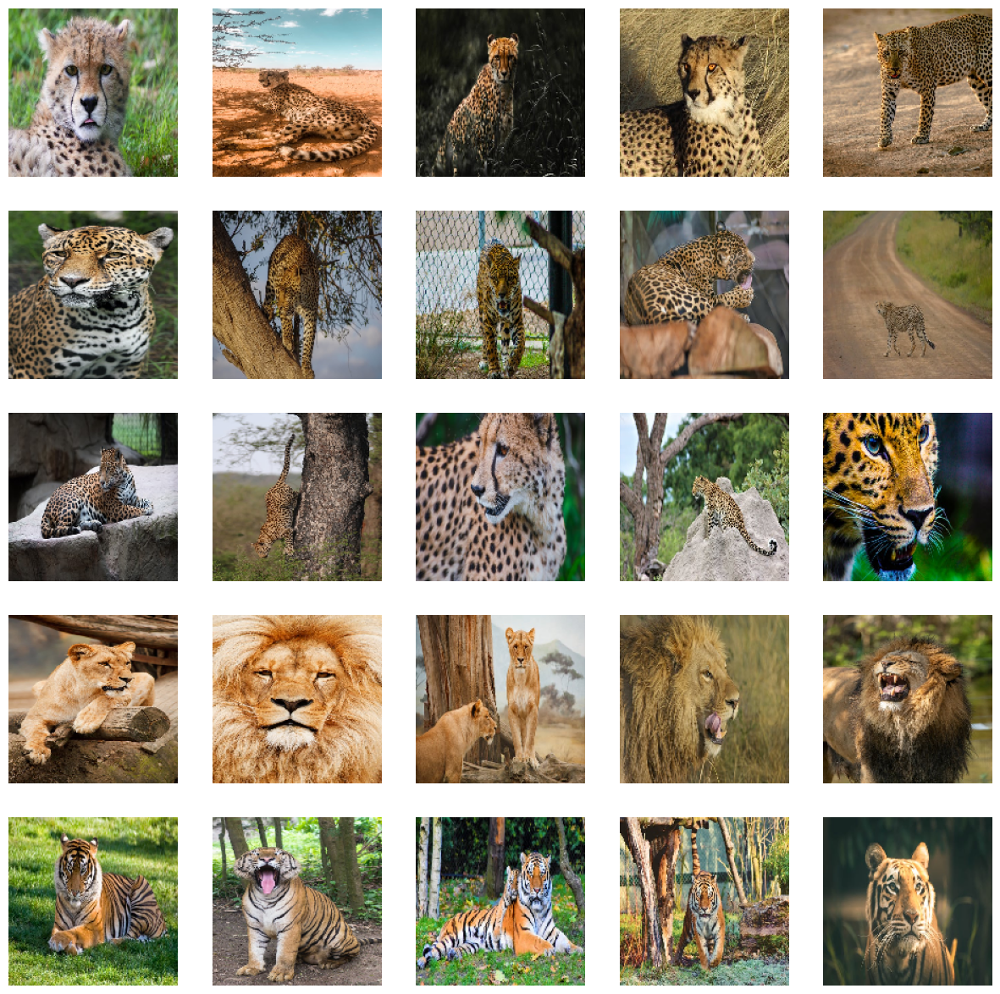

In [16]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Get list of class directories
class_dirs = os.listdir(img_folder)

# Display a few sample images from each class directory
fig, axes = plt.subplots(len(class_dirs), 5, figsize=(15, 3*len(class_dirs)))

for i, class_dir in enumerate(class_dirs):
    # Get list of filenames in the class directory
    class_files = os.listdir(os.path.join(img_folder, class_dir))

    # Print class name
    print(class_dir)

    # Display a few sample images
    for j in range(5):
        img_path = os.path.join(img_folder, class_dir, class_files[j])
        print(img_path)
        img = image.load_img(img_path, target_size=(160, 160))
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

plt.show()


## CNN Model Implementation

In [24]:
# Code for recording the logs of the training to create a visualising the Network
from tensorflow.keras.callbacks import TensorBoard

tensorboard_callback = TensorBoard(log_dir='logs', histogram_freq=1)


In [25]:
# Model Architecture
img_model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(160, 160, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),
    layers.Dense(5, activation='softmax')
])

img_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [27]:
# Training
training_records = img_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[tensorboard_callback]
)


Epoch 1/100
8/8 [==============================] - 4s 485ms/step - loss: 1.6050 - accuracy: 0.2377 - val_loss: 1.6068 - val_accuracy: 0.2188
Epoch 2/100
8/8 [==============================] - 3s 403ms/step - loss: 1.5882 - accuracy: 0.2541 - val_loss: 1.6199 - val_accuracy: 0.2188
Epoch 3/100
8/8 [==============================] - 3s 391ms/step - loss: 1.5953 - accuracy: 0.2295 - val_loss: 1.6000 - val_accuracy: 0.2188
Epoch 4/100
8/8 [==============================] - 3s 460ms/step - loss: 1.5929 - accuracy: 0.2377 - val_loss: 1.5849 - val_accuracy: 0.2812
Epoch 5/100
8/8 [==============================] - 4s 508ms/step - loss: 1.5848 - accuracy: 0.2734 - val_loss: 1.5794 - val_accuracy: 0.3125
Epoch 6/100
8/8 [==============================] - 3s 396ms/step - loss: 1.5902 - accuracy: 0.2787 - val_loss: 1.6077 - val_accuracy: 0.2188
Epoch 7/100
8/8 [==============================] - 3s 421ms/step - loss: 1.5790 - accuracy: 0.3115 - val_loss: 1.5833 - val_accuracy: 0.3125
Epoch 8/100
8

## Graph showing accuracy and loss over the training period

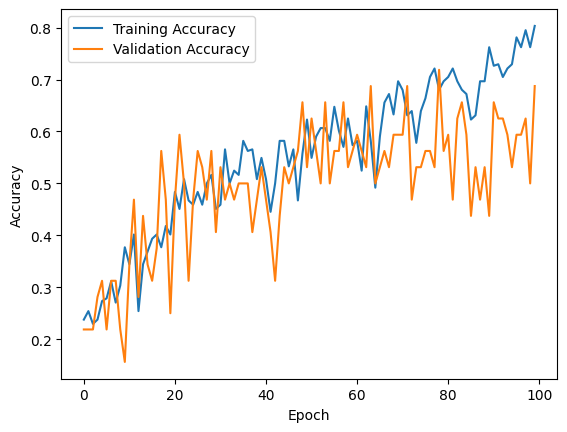

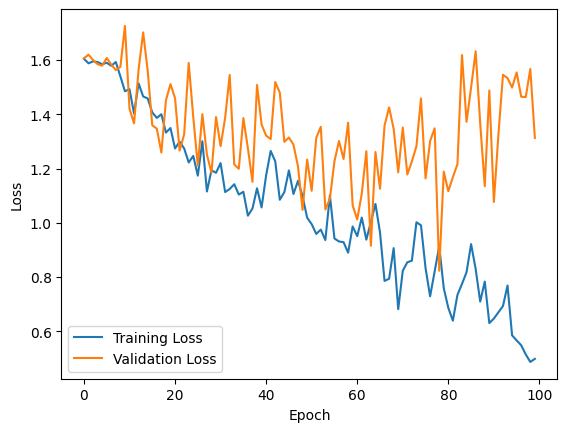

In [31]:
plt.plot(training_records.history['accuracy'], label='Training Accuracy')
plt.plot(training_records.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(training_records.history['loss'], label='Training Loss')
plt.plot(training_records.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [30]:
%load_ext tensorboard
%tensorboard --logdir logs


<IPython.core.display.Javascript object>

2/2 [==============================] - 1s 308ms/step


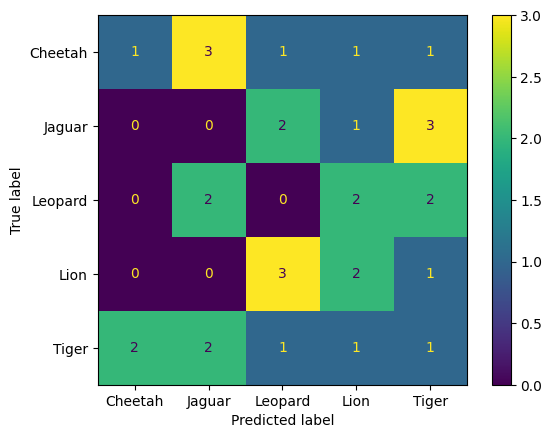

In [32]:
# Confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get true labels and predictions
y_true = validation_generator.classes
y_pred = img_model.predict(validation_generator).argmax(axis=1)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=validation_generator.class_indices)
disp.plot()